# The Objective
**The goal of this project is to predict the price of a cab ride in New York City given the historical dataset of trips and trip data. Predicting the fare before the ride could be very useful for trip planning for both the rider and the taxi agency.**

# Import Importatnt Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings 
warnings.filterwarnings('ignore')

In [2]:
%autosave 60

Autosaving every 60 seconds


# Uploading dataset

In [3]:
df =pd.read_csv(r"D:\CELLULA\Task 2\final_internship_data\final_internship_data.csv",encoding="utf-8")

In [4]:
df.head()

,User ID,User Name,Driver Name,Car Condition,Weather,Traffic Condition,key,fare_amount,pickup_datetime,pickup_longitude,...,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
0,KHVrEVlD,Kimberly Adams,Amy Butler,Very Good,windy,Congested Traffic,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21,-1.288826,...,6,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897
1,lPxIuEri,Justin Tapia,Hannah Zimmerman,Excellent,cloudy,Flow Traffic,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16,-1.291824,...,1,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217
2,gsVN8JLS,Elizabeth Lopez,Amanda Jackson,Bad,stormy,Congested Traffic,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00,-1.291242,...,8,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961
3,9I7kWFgd,Steven Wilson,Amy Horn,Very Good,stormy,Flow Traffic,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42,-1.291319,...,4,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905
4,8QN5ZaGN,Alexander Andrews,Cassandra Larson,Bad,stormy,Congested Traffic,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00,-1.290987,...,3,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703


In [5]:
df.columns

Index(['User ID', 'User Name', 'Driver Name', 'Car Condition', 'Weather',
       'Traffic Condition', 'key', 'fare_amount', 'pickup_datetime',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'passenger_count', 'hour', 'day', 'month',
       'weekday', 'year', 'jfk_dist', 'ewr_dist', 'lga_dist', 'sol_dist',
       'nyc_dist', 'distance', 'bearing'],
      dtype='object')

#### here's a detailed explanation of each column in the dataset:

- User ID: Unique identifier for the user of the taxi ride.
- User Name: Name of the user taking the taxi ride.
- Driver Name: Name of the taxi driver.
- Car Condition: Condition of the taxi's car (e.g., Very Good, Excellent, Bad).
- Weather: Weather condition at the time of the ride.
- Traffic Condition: Traffic condition during the ride.
- key: A unique identifier for each trip.
- fare_amount: The fare amount for the taxi ride.
- pickup_datetime: Date and time when the ride started.
- pickup_longitude: Longitude coordinate of the pickup location.
- pickup_latitude: Latitude coordinate of the pickup location.
- dropoff_longitude: Longitude coordinate of the drop-off location.
- dropoff_latitude: Latitude coordinate of the drop-off location.
- passenger_count: Number of passengers in the taxi ride.
- hour: Hour of the day when the ride started.
- day: Day of the month when the ride started.
- month: Month when the ride started.
- weekday: Day of the week when the ride started.
- year: Year when the ride started.
- jfk_dist: Distance to John F. Kennedy International Airport.
- ewr_dist: Distance to Newark Liberty International Airport.
- lga_dist: Distance to LaGuardia Airport.
- sol_dist: Distance to Statue of Liberty.
- nyc_dist: Distance to the center of New York City.
- distance: Total distance traveled during the ride.
- bearing: Bearing or direction of travel during the ride.


# Data Preprocessing 

In [6]:
# dropping unnecessary columns
df = df.drop(columns =['User ID','User Name','Driver Name','key'],axis = 1)

In [7]:
df

,Car Condition,Weather,Traffic Condition,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,...,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
0,Very Good,windy,Congested Traffic,4.5,2009-06-15 17:26:21,-1.288826,0.710721,-1.288779,0.710563,1,...,6,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897
1,Excellent,cloudy,Flow Traffic,16.9,2010-01-05 16:52:16,-1.291824,0.710546,-1.291182,0.711780,1,...,1,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217
2,Bad,stormy,Congested Traffic,5.7,2011-08-18 00:35:00,-1.291242,0.711418,-1.291391,0.711231,2,...,8,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961
3,Very Good,stormy,Flow Traffic,7.7,2012-04-21 04:30:42,-1.291319,0.710927,-1.291396,0.711363,1,...,4,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905
4,Bad,stormy,Congested Traffic,5.3,2010-03-09 07:51:00,-1.290987,0.711536,-1.290787,0.711811,1,...,3,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,Bad,rainy,Dense Traffic,7.0,2015-05-07 18:45:12,-1.291173,0.711514,-1.290951,0.711371,1,...,5,3,2015,42.565403,36.580043,17.157511,20.401068,12.280187,1.404709,-2.275706
499996,Very Good,rainy,Flow Traffic,13.7,2010-09-13 12:11:34,-1.291595,0.710670,-1.291708,0.710540,1,...,9,0,2010,41.814877,27.833416,26.463167,8.596656,0.994796,0.994184,2.556931
499997,Bad,rainy,Flow Traffic,25.0,2014-08-25 00:22:20,-1.291262,0.710796,-1.289737,0.710366,1,...,8,0,2014,31.780108,38.960930,19.708214,19.066488,11.663395,7.859324,-1.926251
499998,Good,stormy,Congested Traffic,6.5,2015-01-12 12:17:32,-1.291101,0.711335,-1.291023,0.711480,6,...,1,0,2015,42.292914,36.382813,17.227166,20.006433,11.819775,0.994470,-0.384817


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 22 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Car Condition      500000 non-null  object 
 1   Weather            500000 non-null  object 
 2   Traffic Condition  500000 non-null  object 
 3   fare_amount        500000 non-null  float64
 4   pickup_datetime    500000 non-null  object 
 5   pickup_longitude   500000 non-null  float64
 6   pickup_latitude    500000 non-null  float64
 7   dropoff_longitude  499995 non-null  float64
 8   dropoff_latitude   499995 non-null  float64
 9   passenger_count    500000 non-null  int64  
 10  hour               500000 non-null  int64  
 11  day                500000 non-null  int64  
 12  month              500000 non-null  int64  
 13  weekday            500000 non-null  int64  
 14  year               500000 non-null  int64  
 15  jfk_dist           499995 non-null  float64
 16  ew

 There are a small amount of null values so we'll drop it.

In [9]:
# Drop rows with missing values in specified columns
df= df.dropna(subset=['dropoff_longitude', 'dropoff_latitude', 'jfk_dist', 'ewr_dist', 'lga_dist', 'sol_dist', 'nyc_dist', 'distance', 'bearing'])


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 499995 entries, 0 to 499999
Data columns (total 22 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Car Condition      499995 non-null  object 
 1   Weather            499995 non-null  object 
 2   Traffic Condition  499995 non-null  object 
 3   fare_amount        499995 non-null  float64
 4   pickup_datetime    499995 non-null  object 
 5   pickup_longitude   499995 non-null  float64
 6   pickup_latitude    499995 non-null  float64
 7   dropoff_longitude  499995 non-null  float64
 8   dropoff_latitude   499995 non-null  float64
 9   passenger_count    499995 non-null  int64  
 10  hour               499995 non-null  int64  
 11  day                499995 non-null  int64  
 12  month              499995 non-null  int64  
 13  weekday            499995 non-null  int64  
 14  year               499995 non-null  int64  
 15  jfk_dist           499995 non-null  float64
 16  ew

In [11]:
# Rearrange columns in the data frame
# Get column names excluding 'fare_amount'
cols = [col for col in df.columns if col != 'fare_amount']

# Rearrange the columns with 'fare_amount' as the last column
new_cols = cols + ['fare_amount']
df = df[new_cols]


In [13]:
df.head(3)

,Car Condition,Weather,Traffic Condition,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
0,Very Good,windy,Congested Traffic,2009-06-15 17:26:21,-1.288826,0.710721,-1.288779,0.710563,1,17,...,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897,4.5
1,Excellent,cloudy,Flow Traffic,2010-01-05 16:52:16,-1.291824,0.710546,-1.291182,0.711780,1,16,...,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217,16.9
2,Bad,stormy,Congested Traffic,2011-08-18 00:35:00,-1.291242,0.711418,-1.291391,0.711231,2,0,...,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961,5.7


In [14]:
# let's see if there duplicated rows
df.duplicated().sum()

0

In [15]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
pickup_longitude,499995.0,-1.265714,0.206934,-52.119764,-1.291405,-1.291226,-1.290970,37.360538
pickup_latitude,499995.0,0.696742,0.140906,-54.389440,0.710958,0.711268,0.711520,29.724576
dropoff_longitude,499995.0,-1.265755,0.205903,-59.049665,-1.291393,-1.291197,-1.290908,0.712985
dropoff_latitude,499995.0,0.696675,0.128997,-44.676047,0.710943,0.711277,0.711538,7.061893
passenger_count,499995.0,1.683445,1.307391,0.000000,1.000000,1.000000,2.000000,6.000000
hour,499995.0,13.510843,6.511596,0.000000,9.000000,14.000000,19.000000,23.000000
day,499995.0,15.684239,8.681092,1.000000,8.000000,16.000000,23.000000,31.000000
month,499995.0,6.268617,3.437798,1.000000,3.000000,6.000000,9.000000,12.000000
weekday,499995.0,3.042020,1.949243,0.000000,1.000000,3.000000,5.000000,6.000000
year,499995.0,2011.739129,1.860897,2009.000000,2010.000000,2012.000000,2013.000000,2015.000000


  - Min fare amount is negative.
  - Min passenger count is 0.
  - Min distance is 0.
  - there are outliers

In [16]:
df.describe(include ='O')

,Car Condition,Weather,Traffic Condition,pickup_datetime
count,499995,499995,499995,499995
unique,4,5,3,461201
top,Very Good,sunny,Congested Traffic,2012-01-26 21:22:00
freq,125310,100433,166846,6


### let's getting understand each column

In [17]:
df['Car Condition'].value_counts()

Very Good    125310
Bad          124977
Good         124967
Excellent    124741
Name: Car Condition, dtype: int64

In [18]:
df['Weather'].value_counts()

sunny     100433
cloudy    100060
rainy      99971
stormy     99955
windy      99576
Name: Weather, dtype: int64

In [19]:
df['Traffic Condition'].value_counts()

Congested Traffic    166846
Dense Traffic        166581
Flow Traffic         166568
Name: Traffic Condition, dtype: int64

In [20]:
df[['pickup_datetime','hour','day','month','year']].head(50)

,pickup_datetime,hour,day,month,year
0,2009-06-15 17:26:21,17,15,6,2009
1,2010-01-05 16:52:16,16,5,1,2010
2,2011-08-18 00:35:00,0,18,8,2011
3,2012-04-21 04:30:42,4,21,4,2012
4,2010-03-09 07:51:00,7,9,3,2010
5,2011-01-06 09:50:45,9,6,1,2011
6,2012-11-20 20:35:00,20,20,11,2012
7,2012-01-04 17:22:00,17,4,1,2012
8,2012-12-03 13:10:00,13,3,12,2012
9,2009-09-02 01:11:00,1,2,9,2009


  we don't need the pickup_datetime column 

In [21]:
df.drop('pickup_datetime',axis=1,inplace=True)

In [22]:
df['month'].value_counts().sort_index()


1     44547
2     42454
3     46714
4     45959
5     46733
6     44827
7     38127
8     35871
9     37979
10    40551
11    37757
12    38476
Name: month, dtype: int64

In [23]:
df['year'].value_counts().sort_index()

2009    77002
2010    75791
2011    79528
2012    80222
2013    78033
2014    74608
2015    34811
Name: year, dtype: int64

The significant drop in taxi trips in 2015 compared to previous years could be attributed to :
This decline is attributed to the rise of ridesharing services like Uber, which have provided passengers with alternative transportation options. The increased competition from Uber has impacted traditional taxi drivers, leading to dissatisfaction and economic challenges within the taxi industry.
if you want to get more information, read this article: https://www.businessinsider.com/taxi-trips-down-10-percent-new-york-uber-2015-8

In [24]:
df['day'].value_counts().sort_index()

1     15573
2     15713
3     15863
4     15767
5     16045
6     16451
7     16642
8     16806
9     16963
10    16763
11    17037
12    17173
13    17246
14    16795
15    16957
16    17088
17    16883
18    16906
19    16888
20    16909
21    16872
22    16706
23    16714
24    16240
25    15450
26    15456
27    15387
28    15856
29    14913
30    14679
31     9254
Name: day, dtype: int64

The lowest value is associated with day number 31. This occurrence is understandable since not every month has 31 days, leading to fewer data points for this particular day.

In [25]:
df['hour'].value_counts().sort_index()

0     19650
1     14556
2     10884
3      7936
4      5864
5      4982
6     10326
7     18231
8     22599
9     23565
10    22428
11    23338
12    24649
13    24404
14    25385
15    24025
16    20569
17    24646
18    30063
19    31382
20    29193
21    28639
22    27817
23    24864
Name: hour, dtype: int64

In [26]:
df['weekday'].value_counts().sort_index()


0    64237
1    69929
2    72230
3    74776
4    77224
5    76212
6    65387
Name: weekday, dtype: int64

In [27]:
# Group the DataFrame by hour and weekday and count the occurrences
grouped = df.groupby(['hour', 'weekday']).size().reset_index(name='count')

# Reset the index of the DataFrame and drop the existing index column
grouped = grouped.reset_index(drop=True)

# Set the maximum number of rows to display to the length of the DataFrame
pd.set_option('display.max_rows', len(grouped))


# Display the DataFrame without the index column
print(grouped.to_string(index=False))

# Reset the maximum number of rows to display to the default value (optional)
pd.reset_option('display.max_rows')


 hour  weekday  count
    0        0   1570
    0        1   1616
    0        2   2113
    0        3   2372
    0        4   3189
    0        5   4352
    0        6   4438
    1        0    962
    1        1    979
    1        2   1276
    1        3   1500
    1        4   2158
    1        5   3728
    1        6   3953
    2        0    660
    2        1    620
    2        2    777
    2        3    919
    2        4   1491
    2        5   3058
    2        6   3359
    3        0    457
    3        1    467
    3        2    503
    3        3    605
    3        4    979
    3        5   2270
    3        6   2655
    4        0    445
    4        1    409
    4        2    447
    4        3    519
    4        4    755
    4        5   1521
    4        6   1768
    5        0    645
    5        1    604
    5        2    679
    5        3    708
    5        4    802
    5        5    766
    5        6    778
    6        0   1614
    6        1   1782
    6     

In [28]:
df['passenger_count'].value_counts()

1    346009
2     73908
5     35322
3     21761
4     10614
6     10590
0      1791
Name: passenger_count, dtype: int64

From Driver Rule 54-15(g) Chapter 54 - Drivers of Taxicabs and Street Hail Liveries

The maximum amount of passengers allowed in a yellow taxicab by law is four (4) in a four (4) passenger taxicab or five (5) passengers in a five (5) passenger taxicab, except that an additional passenger must be accepted if such passenger is under the age of seven (7) and is held on the lap of an adult passenger seated in the rear. 
for more information follow the link: https://www.nyc.gov/site/tlc/passengers/passenger-frequently-asked-questions.page

-------------------------------------------------------------------
Passenger count values of 0 in a taxi dataset could indeed be considered incorrect or anomalous, as it's unlikely for a taxi to have zero passengers during a trip. Such entries might indicate missing or erroneous data.

Here are some possible explanations for passenger count values of 0:

- Data Entry Error: The passenger count value may have been mistakenly entered as 0 instead of the actual number of passengers.

- Missing Data: The passenger count information may have been omitted or not recorded for some trips, leading to a default value of 0.

- Data Anomaly: In some cases, a passenger count of 0 could indicate a specific type of trip, such as a taxi being used for transportation of goods or equipment rather than passengers. However, this scenario is less common and would typically be indicated by a different trip purpose or fare structure.

- Data Corruption: There could be issues with data integrity or data corruption leading to incorrect values being recorded.

In [29]:
# Drop rows where passenger count is zero because it's a small portion of the data
df=df[df['passenger_count']>0]

In [30]:
df

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
0,Very Good,windy,Congested Traffic,-1.288826,0.710721,-1.288779,0.710563,1,17,15,...,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897,4.5
1,Excellent,cloudy,Flow Traffic,-1.291824,0.710546,-1.291182,0.711780,1,16,5,...,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217,16.9
2,Bad,stormy,Congested Traffic,-1.291242,0.711418,-1.291391,0.711231,2,0,18,...,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961,5.7
3,Very Good,stormy,Flow Traffic,-1.291319,0.710927,-1.291396,0.711363,1,4,21,...,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905,7.7
4,Bad,stormy,Congested Traffic,-1.290987,0.711536,-1.290787,0.711811,1,7,9,...,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703,5.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,Bad,rainy,Dense Traffic,-1.291173,0.711514,-1.290951,0.711371,1,18,7,...,3,2015,42.565403,36.580043,17.157511,20.401068,12.280187,1.404709,-2.275706,7.0
499996,Very Good,rainy,Flow Traffic,-1.291595,0.710670,-1.291708,0.710540,1,12,13,...,0,2010,41.814877,27.833416,26.463167,8.596656,0.994796,0.994184,2.556931,13.7
499997,Bad,rainy,Flow Traffic,-1.291262,0.710796,-1.289737,0.710366,1,0,25,...,0,2014,31.780108,38.960930,19.708214,19.066488,11.663395,7.859324,-1.926251,25.0
499998,Good,stormy,Congested Traffic,-1.291101,0.711335,-1.291023,0.711480,6,12,12,...,0,2015,42.292914,36.382813,17.227166,20.006433,11.819775,0.994470,-0.384817,6.5


In [31]:
df[df['distance']==0]

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
11,Bad,rainy,Dense Traffic,0.000000,0.000000,0.000000,0.000000,3,11,24,...,0,2012,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,0.0,0.0,5.5
15,Excellent,windy,Dense Traffic,0.000000,0.000000,0.000000,0.000000,1,12,23,...,5,2013,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,0.0,0.0,5.0
26,Good,cloudy,Congested Traffic,0.000000,0.000000,0.000000,0.000000,1,20,7,...,0,2011,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,0.0,0.0,6.5
105,Very Good,sunny,Flow Traffic,-1.292169,0.711175,-1.292169,0.711175,1,0,25,...,2,2009,49.494963,25.484177,28.288925,13.007479,8.887757,0.0,0.0,52.0
124,Very Good,rainy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,2,17,17,...,3,2013,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,0.0,0.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499724,Good,cloudy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,14,13,...,1,2014,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,0.0,0.0,7.0
499882,Excellent,rainy,Dense Traffic,0.000000,0.000000,0.000000,0.000000,1,8,3,...,1,2014,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,0.0,0.0,4.0
499913,Good,sunny,Dense Traffic,0.000000,0.000000,0.000000,0.000000,2,13,7,...,0,2012,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,0.0,0.0,4.9
499938,Very Good,rainy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,9,10,...,4,2010,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,0.0,0.0,6.9


we will replace the distance values that are equal to zero with the actual distances calculated by subtracting the pickup location from the dropoff location.

In [151]:
# pip install geopy

In [92]:
'''from geopy.distance import geodesic

# Define a function to calculate distance between two points
def calculate_distance(row):
    pickup_coords = (row['pickup_latitude'], row['pickup_longitude'])
    dropoff_coords = (row['dropoff_latitude'], row['dropoff_longitude'])
    return geodesic(pickup_coords, dropoff_coords).miles  # or .kilometers if preferred

# Apply the function to each row to calculate distance
df['distance_refined'] = df.apply(calculate_distance, axis=1)'''


In [93]:
# df

,Car Condition,Weather,Traffic Condition,key,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,...,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount,distance_refined
0,Very Good,windy,Congested Traffic,2009-06-15 17:26:21.0000001,-1.288826,0.710721,-1.288779,0.710563,1,17,...,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897,4.5,0.011321
1,Excellent,cloudy,Flow Traffic,2010-01-05 16:52:16.0000002,-1.291824,0.710546,-1.291182,0.711780,1,16,...,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217,16.9,0.095705
2,Bad,stormy,Congested Traffic,2011-08-18 00:35:00.00000049,-1.291242,0.711418,-1.291391,0.711231,2,0,...,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961,5.7,0.016440
3,Very Good,stormy,Flow Traffic,2012-04-21 04:30:42.0000001,-1.291319,0.710927,-1.291396,0.711363,1,4,...,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905,7.7,0.030394
4,Bad,stormy,Congested Traffic,2010-03-09 07:51:00.000000135,-1.290987,0.711536,-1.290787,0.711811,1,7,...,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703,5.3,0.023401
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,Bad,rainy,Dense Traffic,2015-05-07 18:45:12.0000004,-1.291173,0.711514,-1.290951,0.711371,1,18,...,2015,42.565403,36.580043,17.157511,20.401068,12.280187,1.404709,-2.275706,7.0,0.018208
499996,Very Good,rainy,Flow Traffic,2010-09-13 12:11:34.0000004,-1.291595,0.710670,-1.291708,0.710540,1,12,...,2010,41.814877,27.833416,26.463167,8.596656,0.994796,0.994184,2.556931,13.7,0.011904
499997,Bad,rainy,Flow Traffic,2014-08-25 00:22:20.0000001,-1.291262,0.710796,-1.289737,0.710366,1,0,...,2014,31.780108,38.960930,19.708214,19.066488,11.663395,7.859324,-1.926251,25.0,0.109566
499998,Good,stormy,Congested Traffic,2015-01-12 12:17:32.0000001,-1.291101,0.711335,-1.291023,0.711480,6,12,...,2015,42.292914,36.382813,17.227166,20.006433,11.819775,0.994470,-0.384817,6.5,0.011289


## comparing the new column to the original one we can see it's not a right solution so we will try another way

In [107]:
# df.drop('distance_refined',axis = 1)

,Car Condition,Weather,Traffic Condition,key,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
0,Very Good,windy,Congested Traffic,2009-06-15 17:26:21.0000001,-1.288826,0.710721,-1.288779,0.710563,1,17,...,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897,4.5
1,Excellent,cloudy,Flow Traffic,2010-01-05 16:52:16.0000002,-1.291824,0.710546,-1.291182,0.711780,1,16,...,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217,16.9
2,Bad,stormy,Congested Traffic,2011-08-18 00:35:00.00000049,-1.291242,0.711418,-1.291391,0.711231,2,0,...,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961,5.7
3,Very Good,stormy,Flow Traffic,2012-04-21 04:30:42.0000001,-1.291319,0.710927,-1.291396,0.711363,1,4,...,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905,7.7
4,Bad,stormy,Congested Traffic,2010-03-09 07:51:00.000000135,-1.290987,0.711536,-1.290787,0.711811,1,7,...,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703,5.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,Bad,rainy,Dense Traffic,2015-05-07 18:45:12.0000004,-1.291173,0.711514,-1.290951,0.711371,1,18,...,3,2015,42.565403,36.580043,17.157511,20.401068,12.280187,1.404709,-2.275706,7.0
499996,Very Good,rainy,Flow Traffic,2010-09-13 12:11:34.0000004,-1.291595,0.710670,-1.291708,0.710540,1,12,...,0,2010,41.814877,27.833416,26.463167,8.596656,0.994796,0.994184,2.556931,13.7
499997,Bad,rainy,Flow Traffic,2014-08-25 00:22:20.0000001,-1.291262,0.710796,-1.289737,0.710366,1,0,...,0,2014,31.780108,38.960930,19.708214,19.066488,11.663395,7.859324,-1.926251,25.0
499998,Good,stormy,Congested Traffic,2015-01-12 12:17:32.0000001,-1.291101,0.711335,-1.291023,0.711480,6,12,...,0,2015,42.292914,36.382813,17.227166,20.006433,11.819775,0.994470,-0.384817,6.5


### we'll try another way to calculate the distance
**We will calculate the distance for each trip based on the fare amount column, considering the following fare rate structure:**

For the initial 1/5 mile traveled, a flat rate of ($2.50) was applied. After covering this initial distance, an additional charge of $0.50 was applied for each subsequent 1/5 mile traveled. This fare structure enables us to estimate the distance traveled for each trip, leveraging the fare information provided.





In [32]:
# Define fare rates
rate1_distance = 1/5  # mile
rate1_fare = 2.50  # dollars

rate2_distance = 1/5  # mile
rate2_fare_per_mile = 0.50  # dollars

# Function to estimate distance based on fare amount
def estimate_distance_from_fare(fare_amount):
    # Calculate distance covered by the initial $2.50 fare
    initial_distance = min(fare_amount / rate1_fare, rate1_distance)
    
    # Calculate remaining fare amount after covering initial distance
    remaining_fare = max(fare_amount - rate1_fare, 0)
    
    # Calculate additional distance covered by remaining fare amount
    additional_distance = remaining_fare / rate2_fare_per_mile
    
    # Total estimated distance
    estimated_distance = initial_distance + additional_distance
    
    return estimated_distance

# Assuming your DataFrame is called df
# Replace distance values of zero with estimated distances
df['distance'] = df.apply(lambda row: estimate_distance_from_fare(row['fare_amount']) if row['distance'] == 0 else row['distance'], axis=1)


In [33]:
df[df['distance']==0]

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
105051,Very Good,rainy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,2,21,21,...,2,2013,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,0.0,0.0,0.0
331597,Bad,windy,Flow Traffic,-1.291236,0.709999,-1.291236,0.709999,1,6,5,...,0,2013,35.473020,31.533014,28.461975,10.679406,8.617154,0.0,0.0,0.0
436658,Good,stormy,Flow Traffic,-1.292302,0.711889,-1.292302,0.711889,1,22,4,...,2,2015,55.489750,29.964242,28.869537,22.019098,17.609583,0.0,0.0,0.0


In [34]:
df=df[df['distance'] > 0]

In [35]:
df

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
0,Very Good,windy,Congested Traffic,-1.288826,0.710721,-1.288779,0.710563,1,17,15,...,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897,4.5
1,Excellent,cloudy,Flow Traffic,-1.291824,0.710546,-1.291182,0.711780,1,16,5,...,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217,16.9
2,Bad,stormy,Congested Traffic,-1.291242,0.711418,-1.291391,0.711231,2,0,18,...,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961,5.7
3,Very Good,stormy,Flow Traffic,-1.291319,0.710927,-1.291396,0.711363,1,4,21,...,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905,7.7
4,Bad,stormy,Congested Traffic,-1.290987,0.711536,-1.290787,0.711811,1,7,9,...,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703,5.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,Bad,rainy,Dense Traffic,-1.291173,0.711514,-1.290951,0.711371,1,18,7,...,3,2015,42.565403,36.580043,17.157511,20.401068,12.280187,1.404709,-2.275706,7.0
499996,Very Good,rainy,Flow Traffic,-1.291595,0.710670,-1.291708,0.710540,1,12,13,...,0,2010,41.814877,27.833416,26.463167,8.596656,0.994796,0.994184,2.556931,13.7
499997,Bad,rainy,Flow Traffic,-1.291262,0.710796,-1.289737,0.710366,1,0,25,...,0,2014,31.780108,38.960930,19.708214,19.066488,11.663395,7.859324,-1.926251,25.0
499998,Good,stormy,Congested Traffic,-1.291101,0.711335,-1.291023,0.711480,6,12,12,...,0,2015,42.292914,36.382813,17.227166,20.006433,11.819775,0.994470,-0.384817,6.5


In [36]:
# Randomly sample rows to see how distance influence the fare_amount column
df.sample(50)

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
307148,Good,rainy,Dense Traffic,-1.291602,0.710918,-1.291667,0.043051,6,20,25,...,0,2012,4266.272078,4265.175686,4272.042917,4256.096952,4254.993854,4254.977852,3.141488,4.9
433996,Good,cloudy,Congested Traffic,-1.291431,0.710855,-1.291593,0.711037,1,8,5,...,1,2011,42.540043,30.220133,23.257857,12.767512,4.801108,1.399126,0.595131,5.7
156120,Very Good,windy,Flow Traffic,-1.291207,0.711400,-1.291175,0.711261,1,21,30,...,2,2014,42.648123,34.845796,18.670815,18.477771,10.381393,0.898603,-2.970243,5.5
77435,Bad,rainy,Congested Traffic,-1.291327,0.711018,-1.291348,0.711559,2,8,21,...,2,2014,43.551533,33.479410,20.430722,17.339376,9.427696,3.451106,0.029530,13.0
294611,Excellent,stormy,Congested Traffic,-1.290649,0.711642,-1.291332,0.711112,1,21,25,...,3,2010,41.766847,36.891498,16.817334,20.134163,11.883384,4.714155,2.368051,10.9
106883,Very Good,cloudy,Flow Traffic,-1.291252,0.711515,-1.291222,0.711499,2,14,17,...,0,2013,44.393832,35.414464,18.655765,20.096126,12.289370,0.178660,-2.188827,3.0
158497,Good,sunny,Congested Traffic,-1.291053,0.711158,-1.291401,0.711029,1,11,14,...,3,2009,41.206187,33.396713,19.946646,15.915571,7.627801,1.874135,2.025226,8.1
386636,Good,rainy,Flow Traffic,-1.291294,0.711336,-1.291338,0.711456,1,11,4,...,1,2011,44.113830,34.103967,19.654023,18.496762,10.709339,0.793350,0.266962,4.9
492512,Excellent,cloudy,Dense Traffic,-1.291208,0.711471,-1.291844,0.710476,1,21,5,...,1,2011,43.398405,30.595229,23.676891,12.980593,7.170326,7.046189,2.689920,16.5
311546,Very Good,cloudy,Congested Traffic,-1.290922,0.711403,-1.291070,0.711324,1,8,23,...,2,2011,41.439567,36.729197,16.724252,19.961879,11.667243,0.871277,2.183905,4.5


We will apply a clipping operation to the distance column, setting a threshold of 500 to remove extreme outliers and ensure a more robust analysis.

In [37]:
df[df['distance'] > 500]

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
472,Excellent,sunny,Dense Traffic,0.000000,0.000000,-1.291638,0.710815,2,22,22,...,6,2009,8668.153807,8694.401918,8669.869308,8675.088983,8668.522603,8667.304968,0.904511,2.50
1260,Excellent,stormy,Flow Traffic,-1.291088,0.711304,0.000000,0.000000,2,20,10,...,3,2011,8667.572904,8697.940126,8666.238101,8679.184826,8672.405355,8665.268588,-1.756159,5.70
2280,Bad,sunny,Dense Traffic,-1.290438,0.711358,0.000000,0.711358,1,8,29,...,0,2011,6039.040636,6068.088164,6026.510716,6049.882416,6041.527913,6026.494216,-1.163494,8.90
2397,Excellent,windy,Congested Traffic,0.000000,0.000000,-1.291722,0.710603,2,17,24,...,6,2012,8667.952420,8693.706529,8670.875819,8673.813490,8667.454877,8667.454421,0.904709,45.00
4278,Very Good,rainy,Flow Traffic,-1.291067,0.711351,0.000000,0.000000,1,23,7,...,1,2015,8667.677588,8698.150754,8666.060464,8679.480476,8672.713222,8665.223767,-1.756184,7.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
496215,Bad,sunny,Flow Traffic,0.000000,0.000000,-1.291017,0.711417,1,17,12,...,3,2011,8667.756371,8698.541814,8665.727773,8679.959059,8673.197063,8665.063905,0.903851,20.90
497167,Excellent,stormy,Dense Traffic,0.000000,0.000000,-1.291354,0.711362,2,20,18,...,2,2013,8668.815735,8696.918624,8667.392165,8678.738594,8672.215828,8666.597297,0.903981,57.33
498392,Excellent,sunny,Congested Traffic,0.000000,0.000000,-1.291118,0.711376,1,18,4,...,3,2014,8667.966396,8697.990723,8666.259924,8679.454524,8672.731186,8665.493018,0.903911,14.50
499635,Excellent,sunny,Flow Traffic,0.000000,0.000000,-1.291423,0.711517,1,15,20,...,6,2013,8669.678915,8697.081216,8667.556683,8679.445134,8673.101030,8667.104889,0.903868,12.50


In [38]:
df=df[df['distance']<=500]

In [39]:
df[df['distance']>100].sample(50)

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
10710,Excellent,stormy,Flow Traffic,-1.290765,0.691223,-1.290770,0.711620,1,21,11,...,4,2011,137.124767,142.411231,137.639961,132.826982,131.302251,129.950483,0.000154,3.70
184670,Excellent,windy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,16,6,...,5,2012,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,108.800000,0.000000,56.80
435651,Bad,cloudy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,19,24,...,0,2012,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,108.800000,0.000000,56.80
340972,Bad,stormy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,23,27,...,6,2014,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,111.200000,0.000000,58.00
135709,Good,windy,Flow Traffic,-1.291278,0.711196,-1.316826,0.711142,1,0,4,...,4,2011,162.418678,124.728852,142.750604,126.795638,125.804210,123.310877,1.565241,17.30
139626,Good,stormy,Congested Traffic,0.000000,0.000000,0.000000,0.000000,1,4,21,...,0,2014,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,135.200000,0.000000,70.00
248111,Excellent,rainy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,1,19,...,5,2013,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,119.200000,0.000000,62.00
215578,Very Good,sunny,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,0,6,...,5,2013,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,110.200000,0.000000,57.50
246794,Very Good,cloudy,Flow Traffic,-1.287751,0.709373,-1.287751,0.709373,1,16,30,...,5,2012,1.159414,65.984936,33.272213,45.291881,40.823494,115.200000,0.000000,60.00
78167,Good,rainy,Congested Traffic,-1.291560,0.753691,-1.291458,0.711218,6,14,24,...,0,2012,305.387169,293.265989,278.511177,285.279025,278.633332,270.597736,-3.139765,4.50


handle the condition where the distance is above 100 and the fare is below 15, we can set the distance equal to the mean distance

In [42]:
mean_distance = df['distance'].median()

# Update the distance column based on the condition
df.loc[(df['distance'] > 100) & (df['fare_amount'] < 30), 'distance'] = mean_distance


According to an April 2011 study by the Chicago Dispatcher, New York City taxis have a relatively low standard fare, charging an estimated $14.10 for a distance of five miles and five minutes wait time

In [43]:
df[df['distance']> 100]

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
737,Bad,sunny,Flow Traffic,-1.287642,0.709412,-1.287642,0.709412,2,19,11,...,0,2014,1.516304,66.938201,33.329179,46.207031,41.609595,109.860000,0.000000,57.33
1335,Excellent,rainy,Congested Traffic,-1.299037,0.706859,-1.299037,0.706859,1,20,16,...,2,2013,114.185443,61.401401,112.369819,77.412336,85.828862,355.200000,0.000000,180.00
2346,Very Good,cloudy,Dense Traffic,-1.293052,0.712827,-1.293052,0.712827,1,0,7,...,5,2009,68.616622,36.011049,38.760226,34.702791,31.457557,121.200000,0.000000,63.00
5663,Excellent,cloudy,Congested Traffic,-1.276488,0.721975,-1.291560,0.710903,1,7,25,...,2,2009,118.403242,129.213950,101.859435,113.017551,104.802091,101.094619,2.338137,49.15
6326,Good,windy,Congested Traffic,0.000000,0.000000,0.000000,0.000000,1,16,4,...,5,2013,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,109.860000,0.000000,57.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497067,Good,windy,Congested Traffic,0.000000,0.000000,0.000000,0.000000,5,17,12,...,4,2010,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,163.800000,0.000000,84.30
497370,Excellent,cloudy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,19,18,...,4,2013,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,255.200000,0.000000,130.00
497585,Very Good,windy,Congested Traffic,-1.292175,0.710625,-1.292175,0.710625,1,1,9,...,4,2013,46.578176,22.919240,30.761030,6.082066,5.036532,125.200000,0.000000,65.00
497739,Excellent,sunny,Dense Traffic,0.000000,0.000000,0.000000,0.000000,2,22,14,...,4,2012,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,108.800000,0.000000,56.80


In [53]:
df[df['fare_amount']<2.5]

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount
2039,Good,stormy,Congested Traffic,-1.287869,0.709363,-1.287855,0.709336,1,23,9,...,1,2010,1.846366,64.974364,33.066859,44.312412,39.949645,0.184225,-2.773833,-2.90
2486,Bad,windy,Flow Traffic,-1.291544,0.710709,-1.291540,0.710707,1,5,22,...,6,2015,41.388169,29.116540,24.876702,10.256816,1.796301,0.021244,-2.070541,-2.50
2780,Excellent,cloudy,Flow Traffic,-1.290480,0.710593,-1.290526,0.710593,1,15,1,...,4,2015,31.849300,38.777384,18.119048,18.402818,11.130760,0.221878,1.553575,0.01
10002,Good,rainy,Dense Traffic,-1.291319,0.711026,-1.291647,0.710593,1,14,15,...,0,2010,41.575915,30.061156,23.801745,11.597941,3.231562,3.184763,2.620964,0.00
13032,Bad,sunny,Congested Traffic,-1.291457,0.711060,-1.291472,0.711071,4,8,30,...,4,2013,42.914915,31.117678,22.206688,14.187900,6.257058,0.096377,0.802983,-3.00
27891,Excellent,windy,Congested Traffic,-1.292904,0.712194,-1.292904,0.712194,1,21,15,...,4,2015,62.473620,29.451594,35.143205,26.517105,23.658551,0.001064,-0.647921,0.00
28839,Bad,cloudy,Flow Traffic,-1.287796,0.709449,0.000000,0.000000,1,13,11,...,6,2013,8647.851804,8712.832389,8673.451955,8692.106100,8687.155886,8647.451783,-1.758013,-2.50
36722,Bad,sunny,Congested Traffic,-1.290709,0.711922,-1.290672,0.711969,1,15,30,...,3,2015,44.517918,42.749523,13.596505,27.657482,19.552471,0.352924,-0.536786,-2.50
42337,Bad,windy,Flow Traffic,-1.291386,0.711326,-1.291209,0.711394,1,10,9,...,0,2015,43.703063,34.058630,19.560114,18.204302,10.347577,0.958127,-1.103210,-5.00
47302,Good,windy,Flow Traffic,-1.290537,0.712204,-1.290539,0.712201,1,19,18,...,3,2010,46.154178,45.735780,13.399073,31.191129,23.131528,0.018420,2.577566,0.00


-  fares begin at 2.50 (3.00 after 8:00 p.m., and 3.50 during the peak weekday hours of 4:00–8:00 p.m.) and increase based on the distance traveled and time spent in slow traffic (40 cents for each one-fifth of a mile or 60 seconds of no motion or motion under 12 miles an hour). 
- Zero or negative fare_amount values are not permitted, as payment is expected for all rides.
- The aforementioned data seems to be inaccurate and should be excluded from the dataset.


In [44]:
df=df[df['fare_amount']>=2.5]

**now we will create a new column named base fare, due to these information:**
- Fares begin at $2.50.
- After 8:00 p.m., the base fare increases to 3.00.
- During peak weekday hours (4:00–8:00 p.m.) the base fare is 3.50.


In [46]:
def baseFare(x):
    if x in range(16,20):
        base_fare = 3.50
    elif x in range(20,24):
        base_fare = 3
    else:
        base_fare = 2.50
    return base_fare

df['base_fare'] = df['hour'].apply(baseFare)


Now, let's checking if there are any rows where the fare amount is less than the base fare

In [48]:
# Filter rows where fare amount is less than base fare
rows_with_less_fare = df[df['fare_amount'] < df['base_fare']]

# Display the rows
rows_with_less_fare

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount,base_fare
630,Good,rainy,Dense Traffic,-1.291149,0.711355,-1.291100,0.711340,1,16,10,...,2009,42.275934,35.507357,17.978075,19.027087,10.857136,0.256796,-1.969214,2.9,3.5
922,Bad,stormy,Dense Traffic,-1.290828,0.710567,-1.290830,0.710562,1,23,28,...,2012,34.415346,35.602378,20.506527,15.295970,7.986752,0.038475,2.866493,2.5,3.0
1406,Excellent,cloudy,Flow Traffic,-1.291233,0.710980,-1.291292,0.710962,1,18,6,...,2013,40.626823,32.581525,20.905144,14.530298,6.102526,0.308520,1.951883,3.0,3.5
1564,Bad,rainy,Congested Traffic,-1.290902,0.711503,-1.290829,0.711603,2,19,9,...,2010,42.085912,38.880371,15.038022,22.629622,14.377057,0.724840,-0.509067,3.3,3.5
1684,Very Good,cloudy,Dense Traffic,-1.276488,0.721975,-1.291483,0.711140,2,19,2,...,2009,118.850919,130.072215,100.945974,114.467442,106.359344,99.771579,2.329958,2.5,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
498172,Very Good,rainy,Flow Traffic,-1.291100,0.711898,-1.291019,0.712003,1,17,23,...,2012,46.968719,39.771825,17.102787,25.850460,18.186497,0.775779,-0.523871,3.3,3.5
498244,Bad,cloudy,Congested Traffic,-1.291200,0.711025,-1.291207,0.711013,1,17,25,...,2014,40.463760,33.306716,20.128580,15.359517,6.927671,0.086516,2.720221,3.0,3.5
499033,Very Good,sunny,Dense Traffic,-1.290587,0.711799,-1.290584,0.711798,6,18,14,...,2014,42.438352,42.707447,12.275479,26.760276,18.473061,0.013112,-1.758462,2.5,3.5
499436,Bad,windy,Flow Traffic,-1.291268,0.710930,-1.291308,0.710875,3,16,17,...,2011,40.383186,32.100468,21.525736,13.739847,5.271717,0.402012,2.634248,3.3,3.5


### Now , let's replacing the fare amounts where the base fare is greater than the fare amount, while considering the distance traveled.


In [55]:
# Calculate additional fare based on distance traveled (40 cents for each one-fifth of a mile)
additional_fare_per_distance = 0.40

# Assuming df is your DataFrame containing the data

# Step 1: Identify rows where the base fare is greater than the fare amount
rows_with_less_fare = df[df['base_fare'] > df['fare_amount']]

# Step 2: Calculate additional fare based on distance traveled
for index, row in rows_with_less_fare.iterrows():
    # Calculate additional fare based on distance (40 cents for each one-fifth of a mile)
    additional_fare = row['distance'] / 0.2 * additional_fare_per_distance
    
    # Adjust fare amount by adding the additional fare
    fare_amount_adjusted = row['base_fare'] + additional_fare
    
    # Update fare amount in the DataFrame with the adjusted value
    df.at[index, 'fare_amount'] = fare_amount_adjusted


In [57]:
df[df['base_fare'] > df['fare_amount']]

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount,base_fare


In [58]:
df[df['fare_amount']>200]

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount,base_fare
1684,Very Good,cloudy,Dense Traffic,-1.276488,0.721975,-1.291483,0.711140,2,19,2,...,2009,118.850919,130.072215,100.945974,114.467442,106.359344,99.771579,2.329958,203.043158,3.5
110337,Excellent,sunny,Dense Traffic,0.000000,0.000000,0.000000,0.000000,2,23,30,...,2014,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,419.200000,0.000000,212.000000,3.0
130460,Good,cloudy,Congested Traffic,-1.287874,0.709366,-1.275679,0.719296,1,13,1,...,2012,87.027624,139.808482,97.935375,121.065758,114.637441,86.299253,-0.744047,281.050000,2.5
142550,Good,cloudy,Congested Traffic,-1.290127,0.711091,-1.290130,0.711075,1,20,30,...,2012,32.794721,43.507050,11.049822,24.213582,15.993772,0.107639,3.039667,255.000000,3.0
149769,Bad,cloudy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,11,6,...,2012,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,475.200000,0.000000,240.000000,2.5
168218,Bad,windy,Congested Traffic,-1.289155,0.711558,-1.289155,0.711558,2,11,2,...,2015,32.121826,54.237756,2.386057,35.374675,27.071184,0.001064,-2.493407,235.000000,2.5
196990,Very Good,windy,Dense Traffic,0.000000,0.000000,0.000000,0.000000,1,19,26,...,2014,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,429.200000,0.000000,217.000000,3.5
202499,Good,cloudy,Flow Traffic,-1.283545,0.716409,-1.283545,0.716409,1,2,6,...,2012,99.018584,131.671718,81.836662,116.141952,107.659345,445.200000,0.000000,225.000000,2.5
207267,Bad,sunny,Congested Traffic,-1.289215,0.718669,-1.289215,0.718669,1,0,24,...,2014,120.330489,119.042842,88.845278,112.465880,105.515068,0.000139,-0.645216,205.000000,2.5
215662,Excellent,windy,Dense Traffic,-1.291183,0.711417,-1.283902,0.717263,4,13,8,...,2013,75.553867,85.600345,53.175108,70.461962,62.251078,51.137113,-0.752647,211.440000,2.5


#### To enhance the dataset's integrity, we replaced excessively high fare amounts with the mean fare for trips covering shorter distances.






In [59]:
# Filter the DataFrame to include only rows where the distance is between 0 and 2
filtered_df = df[(df['distance'] >= 0) & (df['distance'] <= 2)]

# Calculate the mean fare amount for the filtered rows
mean_fare_amount = filtered_df['fare_amount'].mean()


In [60]:

# List of indices to replace
indices_to_replace = [142550, 207267, 168218,479052,451974,416989,361793,351584,329010,309769,287638,233874,225249]

# Replace fare amounts at each index with the new mean fare amount
for index in indices_to_replace:
    df.at[index, 'fare_amount'] = mean_fare_amount



In [61]:
df[df['fare_amount']> 200]

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount,base_fare
1684,Very Good,cloudy,Dense Traffic,-1.276488,0.721975,-1.291483,0.711140,2,19,2,...,2009,118.850919,130.072215,100.945974,114.467442,106.359344,99.771579,2.329958,203.043158,3.5
110337,Excellent,sunny,Dense Traffic,0.000000,0.000000,0.000000,0.000000,2,23,30,...,2014,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,419.200000,0.000000,212.000000,3.0
130460,Good,cloudy,Congested Traffic,-1.287874,0.709366,-1.275679,0.719296,1,13,1,...,2012,87.027624,139.808482,97.935375,121.065758,114.637441,86.299253,-0.744047,281.050000,2.5
149769,Bad,cloudy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,11,6,...,2012,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,475.200000,0.000000,240.000000,2.5
196990,Very Good,windy,Dense Traffic,0.000000,0.000000,0.000000,0.000000,1,19,26,...,2014,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,429.200000,0.000000,217.000000,3.5
202499,Good,cloudy,Flow Traffic,-1.283545,0.716409,-1.283545,0.716409,1,2,6,...,2012,99.018584,131.671718,81.836662,116.141952,107.659345,445.200000,0.000000,225.000000,2.5
215662,Excellent,windy,Dense Traffic,-1.291183,0.711417,-1.283902,0.717263,4,13,8,...,2013,75.553867,85.600345,53.175108,70.461962,62.251078,51.137113,-0.752647,211.440000,2.5
217225,Excellent,windy,Dense Traffic,-1.287831,0.709543,-1.299968,0.703624,1,12,10,...,2015,71.358556,82.146208,88.317091,77.786688,79.609992,69.862333,2.136977,245.410000,2.5
224160,Bad,sunny,Congested Traffic,-1.287697,0.709422,-1.276245,0.714962,4,17,16,...,2013,66.729788,126.185271,82.816599,106.148509,99.848795,65.542469,-0.998411,201.000000,3.5
247671,Bad,windy,Dense Traffic,-1.288313,0.710341,-1.260059,0.715799,1,13,12,...,2015,146.783965,199.496128,153.230146,178.952005,172.019797,140.514983,-1.311548,495.000000,2.5


In [62]:
df=df[df['fare_amount']<300]

In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 497185 entries, 0 to 499999
Data columns (total 22 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Car Condition      497185 non-null  object 
 1   Weather            497185 non-null  object 
 2   Traffic Condition  497185 non-null  object 
 3   pickup_longitude   497185 non-null  float64
 4   pickup_latitude    497185 non-null  float64
 5   dropoff_longitude  497185 non-null  float64
 6   dropoff_latitude   497185 non-null  float64
 7   passenger_count    497185 non-null  int64  
 8   hour               497185 non-null  int64  
 9   day                497185 non-null  int64  
 10  month              497185 non-null  int64  
 11  weekday            497185 non-null  int64  
 12  year               497185 non-null  int64  
 13  jfk_dist           497185 non-null  float64
 14  ewr_dist           497185 non-null  float64
 15  lga_dist           497185 non-null  float64
 16  so

**let's see what is the wrong with the longitude and latitude**

In [64]:
# Filter the DataFrame to show rows where pickup_longitude is equal to dropoff_longitude 
# and pickup_latitude is equal to dropoff_latitude in the same row
equal_values_df = df[(df['pickup_longitude'] == df['dropoff_longitude']) & 
                     (df['pickup_latitude'] == df['dropoff_latitude'])]

# Display the resulting DataFrame
equal_values_df


,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount,base_fare
11,Bad,rainy,Dense Traffic,0.000000,0.000000,0.000000,0.000000,3,11,24,...,2012,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,6.2,0.0,5.5,2.5
15,Excellent,windy,Dense Traffic,0.000000,0.000000,0.000000,0.000000,1,12,23,...,2013,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,5.2,0.0,5.0,2.5
26,Good,cloudy,Congested Traffic,0.000000,0.000000,0.000000,0.000000,1,20,7,...,2011,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,8.2,0.0,6.5,3.0
105,Very Good,sunny,Flow Traffic,-1.292169,0.711175,-1.292169,0.711175,1,0,25,...,2009,49.494963,25.484177,28.288925,13.007479,8.887757,99.2,0.0,52.0,2.5
124,Very Good,rainy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,2,17,17,...,2013,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,11.2,0.0,8.0,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499724,Good,cloudy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,14,13,...,2014,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,9.2,0.0,7.0,2.5
499882,Excellent,rainy,Dense Traffic,0.000000,0.000000,0.000000,0.000000,1,8,3,...,2014,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,3.2,0.0,4.0,2.5
499913,Good,sunny,Dense Traffic,0.000000,0.000000,0.000000,0.000000,2,13,7,...,2012,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,5.0,0.0,4.9,2.5
499938,Very Good,rainy,Flow Traffic,0.000000,0.000000,0.000000,0.000000,1,9,10,...,2010,17293.486312,17360.264559,17314.695444,17339.554005,17334.256605,9.0,0.0,6.9,2.5


In [65]:
# Remove the filtered rows from the original DataFrame
df.drop(equal_values_df.index, inplace=True)

In [66]:
# Filter the DataFrame to show rows where pickup_longitude is equal to dropoff_longitude
equal_values = df[(df['pickup_longitude'] == df['dropoff_longitude']) | 
                     (df['pickup_latitude'] == df['dropoff_latitude'])]

# Display the resulting DataFrame
equal_values


,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount,base_fare
1714,Bad,cloudy,Congested Traffic,-1.291385,0.710952,-1.291385,0.710899,1,12,21,...,2013,41.341552,31.284989,22.223023,13.294803,4.946457,0.337477,3.141593,3.500000,2.5
6692,Excellent,stormy,Flow Traffic,-1.291690,0.710801,-1.291451,0.710801,1,0,23,...,2011,42.161906,29.127372,24.547172,10.944852,2.950453,1.154470,-1.570718,5.700000,2.5
15490,Excellent,rainy,Flow Traffic,-1.287806,0.709280,-1.287806,0.709280,1,16,15,...,2010,1.196754,65.663774,34.100809,45.051382,40.803197,0.000111,3.141593,3.500222,3.5
15691,Bad,stormy,Flow Traffic,-1.291260,0.711410,-1.291260,0.711520,1,2,22,...,2009,44.227046,34.980202,18.959742,19.526226,11.710391,0.696525,0.000000,3.700000,2.5
16865,Good,rainy,Flow Traffic,-1.290650,0.711127,-1.290654,0.711127,1,12,4,...,2011,36.957034,38.803462,14.760150,20.284470,11.818307,0.016849,1.570795,3.700000,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
487016,Good,cloudy,Dense Traffic,-1.291493,0.711087,-1.291493,0.711087,1,4,12,...,2013,43.290970,30.962549,22.359929,14.261578,6.452123,0.000084,-1.570796,6.000000,2.5
488508,Bad,cloudy,Congested Traffic,-1.290905,0.711429,-1.290905,0.711650,5,11,24,...,2011,42.248775,38.482892,15.485792,22.274151,14.047827,1.409396,0.000000,5.300000,2.5
489805,Good,windy,Dense Traffic,-1.290452,0.711363,-1.290452,0.711363,1,16,9,...,2012,37.524161,41.602649,11.720258,23.674010,15.182406,0.000334,0.000000,8.500000,3.5
494536,Excellent,sunny,Dense Traffic,-1.290653,0.711135,-1.290653,0.711135,1,20,30,...,2010,37.022439,38.824830,14.720065,20.336367,11.866873,0.000222,0.000000,3.000445,3.0


In [67]:
# Remove the filtered rows from the original DataFrame
df.drop(equal_values.index, inplace=True)

In [68]:
# Check for the absence of zero values in longitude or latitude coordinates.
equal_values_zero = df[(df['pickup_longitude'] == 0) | 
                       (df['pickup_latitude'] == 0) | 
                       (df['dropoff_longitude'] == 0) | 
                       (df['dropoff_latitude'] == 0)]
equal_values_zero

,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount,base_fare
343541,Very Good,stormy,Flow Traffic,0.0,0.711595,-0.000175,0.711715,1,13,3,...,2012,12038.284654,12092.04719,12038.973988,12073.610452,12065.391587,1.139029,0.831941,5.5,2.5


In [69]:
df.drop(equal_values_zero.index,inplace = True)

In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 482769 entries, 0 to 499999
Data columns (total 22 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Car Condition      482769 non-null  object 
 1   Weather            482769 non-null  object 
 2   Traffic Condition  482769 non-null  object 
 3   pickup_longitude   482769 non-null  float64
 4   pickup_latitude    482769 non-null  float64
 5   dropoff_longitude  482769 non-null  float64
 6   dropoff_latitude   482769 non-null  float64
 7   passenger_count    482769 non-null  int64  
 8   hour               482769 non-null  int64  
 9   day                482769 non-null  int64  
 10  month              482769 non-null  int64  
 11  weekday            482769 non-null  int64  
 12  year               482769 non-null  int64  
 13  jfk_dist           482769 non-null  float64
 14  ewr_dist           482769 non-null  float64
 15  lga_dist           482769 non-null  float64
 16  so

In [71]:
df['pickup_longitude'].describe()

count    482769.000000
mean         -1.289978
std           0.046842
min          -2.118676
25%          -1.291409
50%          -1.291231
75%          -1.290993
max           0.712319
Name: pickup_longitude, dtype: float64

In [72]:
df[df['pickup_longitude'].between(-2, 1)]


,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount,base_fare
0,Very Good,windy,Congested Traffic,-1.288826,0.710721,-1.288779,0.710563,1,17,15,...,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897,4.5,3.5
1,Excellent,cloudy,Flow Traffic,-1.291824,0.710546,-1.291182,0.711780,1,16,5,...,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217,16.9,3.5
2,Bad,stormy,Congested Traffic,-1.291242,0.711418,-1.291391,0.711231,2,0,18,...,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961,5.7,2.5
3,Very Good,stormy,Flow Traffic,-1.291319,0.710927,-1.291396,0.711363,1,4,21,...,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905,7.7,2.5
4,Bad,stormy,Congested Traffic,-1.290987,0.711536,-1.290787,0.711811,1,7,9,...,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703,5.3,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,Bad,rainy,Dense Traffic,-1.291173,0.711514,-1.290951,0.711371,1,18,7,...,2015,42.565403,36.580043,17.157511,20.401068,12.280187,1.404709,-2.275706,7.0,3.5
499996,Very Good,rainy,Flow Traffic,-1.291595,0.710670,-1.291708,0.710540,1,12,13,...,2010,41.814877,27.833416,26.463167,8.596656,0.994796,0.994184,2.556931,13.7,2.5
499997,Bad,rainy,Flow Traffic,-1.291262,0.710796,-1.289737,0.710366,1,0,25,...,2014,31.780108,38.960930,19.708214,19.066488,11.663395,7.859324,-1.926251,25.0,2.5
499998,Good,stormy,Congested Traffic,-1.291101,0.711335,-1.291023,0.711480,6,12,12,...,2015,42.292914,36.382813,17.227166,20.006433,11.819775,0.994470,-0.384817,6.5,2.5


## The values in the longitude column have been scaled. This means that instead of representing the actual geographic coordinates in degrees, they are represented as numerical values within a certain range.

In [73]:
df['pickup_latitude'].describe()

count    482769.000000
mean          0.710179
std           0.047412
min          -1.291826
25%           0.710987
50%           0.711281
75%           0.711527
max           7.068002
Name: pickup_latitude, dtype: float64

In [74]:
df[df['pickup_latitude'].between(0, 1)]


,Car Condition,Weather,Traffic Condition,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,...,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing,fare_amount,base_fare
0,Very Good,windy,Congested Traffic,-1.288826,0.710721,-1.288779,0.710563,1,17,15,...,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897,4.5,3.5
1,Excellent,cloudy,Flow Traffic,-1.291824,0.710546,-1.291182,0.711780,1,16,5,...,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217,16.9,3.5
2,Bad,stormy,Congested Traffic,-1.291242,0.711418,-1.291391,0.711231,2,0,18,...,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961,5.7,2.5
3,Very Good,stormy,Flow Traffic,-1.291319,0.710927,-1.291396,0.711363,1,4,21,...,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905,7.7,2.5
4,Bad,stormy,Congested Traffic,-1.290987,0.711536,-1.290787,0.711811,1,7,9,...,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703,5.3,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,Bad,rainy,Dense Traffic,-1.291173,0.711514,-1.290951,0.711371,1,18,7,...,2015,42.565403,36.580043,17.157511,20.401068,12.280187,1.404709,-2.275706,7.0,3.5
499996,Very Good,rainy,Flow Traffic,-1.291595,0.710670,-1.291708,0.710540,1,12,13,...,2010,41.814877,27.833416,26.463167,8.596656,0.994796,0.994184,2.556931,13.7,2.5
499997,Bad,rainy,Flow Traffic,-1.291262,0.710796,-1.289737,0.710366,1,0,25,...,2014,31.780108,38.960930,19.708214,19.066488,11.663395,7.859324,-1.926251,25.0,2.5
499998,Good,stormy,Congested Traffic,-1.291101,0.711335,-1.291023,0.711480,6,12,12,...,2015,42.292914,36.382813,17.227166,20.006433,11.819775,0.994470,-0.384817,6.5,2.5


## The values in the latitude column have been scaled. This means that instead of representing the actual geographic coordinates in degrees, they are represented as numerical values within a certain range.

# After thorough research, it has been determined that the latitude values in New York City typically range from 40 to 42, while the longitude values fall within the range of 72 to 75. With this insight, it's imperative to restore the latitude and longitude columns to their original format to accurately reflect the geographic coordinates of the city.


In [75]:
# Define the desired range for pickup latitude
desired_min_pickup_latitude = 40
desired_max_pickup_latitude = 42

# Apply inverse Min-Max Scaling to return the data back to the desired range
df['pickup_latitude_original'] = (df['pickup_latitude'] - df['pickup_latitude'].min()) / (df['pickup_latitude'].max() - df['pickup_latitude'].min()) \
                                  * (desired_max_pickup_latitude - desired_min_pickup_latitude) + desired_min_pickup_latitude


In [76]:
df['pickup_latitude_original']

0         40.479088
1         40.479046
2         40.479255
3         40.479138
4         40.479283
            ...    
499995    40.479278
499996    40.479076
499997    40.479106
499998    40.479235
499999    40.479092
Name: pickup_latitude_original, Length: 482769, dtype: float64

In [77]:
# Define the desired range for dropoff latitude
desired_min_dropoff_latitude = 40
desired_max_dropoff_latitude = 42

# Apply inverse Min-Max Scaling to return the data back to the desired range
df['dropoff_latitude_original'] = (df['dropoff_latitude'] - df['dropoff_latitude'].min()) / (df['dropoff_latitude'].max() - df['dropoff_latitude'].min()) \
                                  * (desired_max_dropoff_latitude - desired_min_dropoff_latitude) + desired_min_dropoff_latitude


In [78]:
df['dropoff_latitude_original']

0         40.479461
1         40.479752
2         40.479621
3         40.479653
4         40.479760
            ...    
499995    40.479654
499996    40.479456
499997    40.479414
499998    40.479681
499999    40.479465
Name: dropoff_latitude_original, Length: 482769, dtype: float64

In [79]:
# Define the desired range for pickup longitude
desired_min_pickup_longitude = -72
desired_max_pickup_longitude = -75

# Apply inverse Min-Max Scaling to return the data back to the desired range
df['pickup_longitude_original'] = (df['pickup_longitude'] - df['pickup_longitude'].min()) / (df['pickup_longitude'].max() - df['pickup_longitude'].min()) \
                                   * (desired_max_pickup_longitude - desired_min_pickup_longitude) + desired_min_pickup_longitude


In [80]:
df['pickup_longitude_original']

0        -72.879390
1        -72.876214
2        -72.876830
3        -72.876749
4        -72.877101
            ...    
499995   -72.876903
499996   -72.876456
499997   -72.876809
499998   -72.876980
499999   -72.876756
Name: pickup_longitude_original, Length: 482769, dtype: float64

In [81]:
# Define the desired range for pickup longitude
desired_min_pickup_longitude = -72
desired_max_pickup_longitude = -75

# Apply inverse Min-Max Scaling to return the data back to the desired range
df['dropoff_longitude_original'] = (df['dropoff_longitude'] - df['dropoff_longitude'].min()) / (df['dropoff_longitude'].max() - df['dropoff_longitude'].min()) \
                                   * (desired_max_pickup_longitude - desired_min_pickup_longitude) + desired_min_pickup_longitude


In [82]:
df['dropoff_longitude_original']

0        -72.879234
1        -72.876689
2        -72.876467
3        -72.876461
4        -72.877107
            ...    
499995   -72.876933
499996   -72.876131
499997   -72.878219
499998   -72.876856
499999   -72.876624
Name: dropoff_longitude_original, Length: 482769, dtype: float64

# Exploratory Data Analysis

Exploratory Data Analysis (EDA) encompasses three main approaches: univariate analysis, which focuses on examining individual variables; bivariate analysis, which explores relationships between pairs of variables; and multivariate analysis, which investigates relationships between multiple variables simultaneously.

#### let's start with univariate analysis:

1- let's creating a bar plot showing the distribution of different car conditions in the dataset. Each bar represents a car  condition category, and the height of the bar represents the frequency or count of occurrences of that category in the dataset

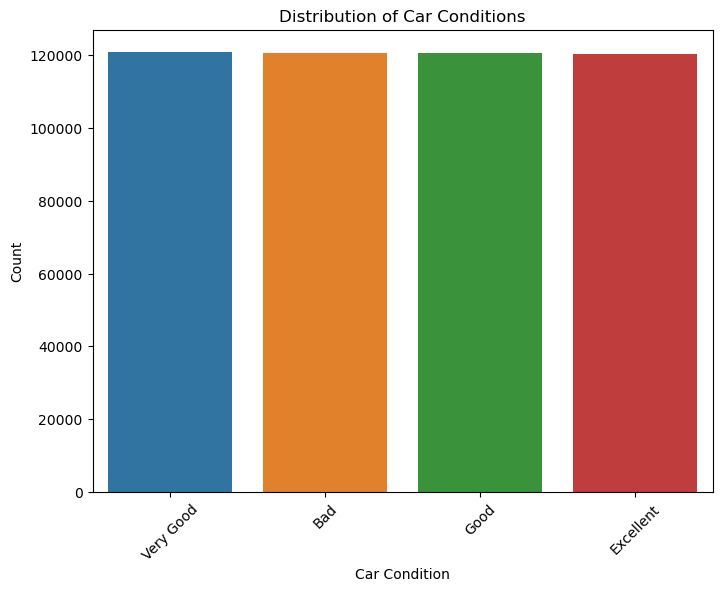

In [83]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Car Condition', order=df['Car Condition'].value_counts().index)
plt.title('Distribution of Car Conditions')
plt.xlabel('Car Condition')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

2- let's creating a bar plot showing the distribution of different traffic conditions in the dataset. Each bar represents a traffic condition category, and the height of the bar represents the frequency or count of occurrences of that category in the dataset

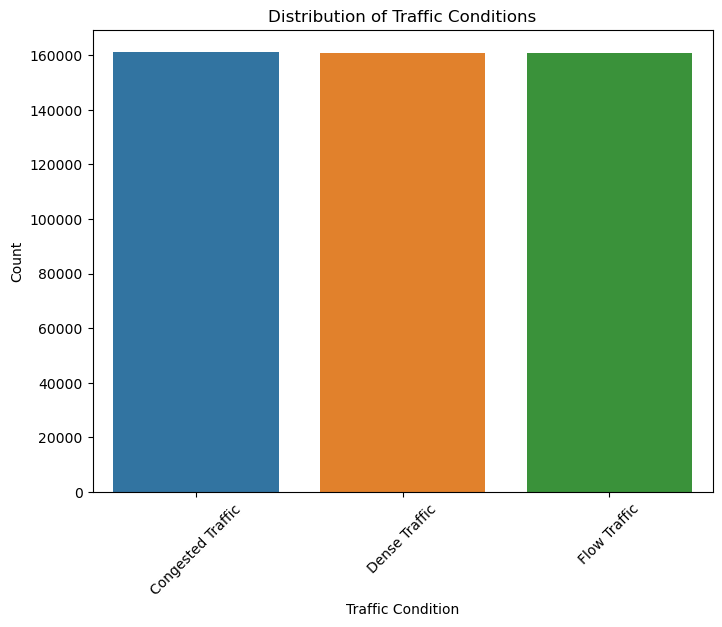

In [84]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Traffic Condition', order=df['Traffic Condition'].value_counts().index)
plt.title('Distribution of Traffic Conditions')
plt.xlabel('Traffic Condition')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

3- let's creating a pie chart showing the distribution of different weather conditions in the dataset. Each segment of the pie represents a weather condition categor

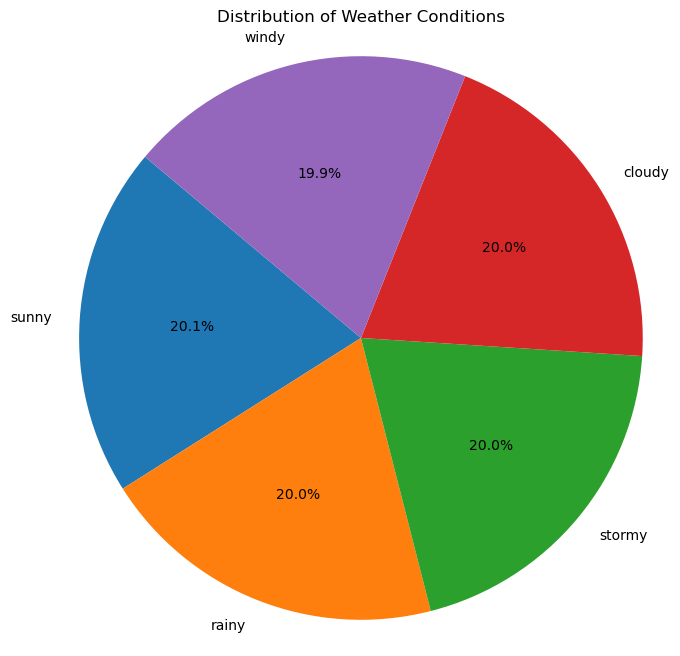

In [85]:
weather_counts = df['Weather'].value_counts()

# Plotting the distribution of weather conditions as a pie chart
plt.figure(figsize=(8, 8))
plt.pie(weather_counts, labels=weather_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Weather Conditions')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

4- create a pie chart showing the distribution of different passenger counts in the dataset

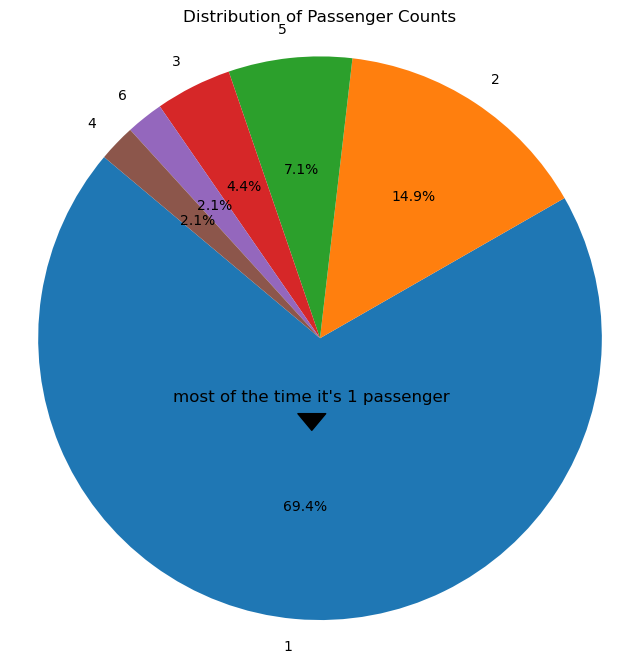

In [86]:
passenger_counts = df['passenger_count'].value_counts()

# Plotting the distribution of passenger counts as a pie chart
plt.figure(figsize=(8, 8))
patches, texts, autotexts = plt.pie(passenger_counts, labels=passenger_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Passenger Counts')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

# Find the blue patch (representing trips with 1 passenger) and calculate its centroid
blue_patch = patches[0]
centroid_x, centroid_y = blue_patch.get_path().vertices[:-1].mean(axis=0)

# Annotate with a note about trips usually having 1 passenger
plt.annotate("most of the time it's 1 passenger", xy=(centroid_x, centroid_y), xytext=(centroid_x, centroid_y + 0.1),
             arrowprops=dict(facecolor='black', shrink=0.5, width=4, headwidth=20),
             fontsize=12, ha='center')

plt.show()

5- a histogram showing the distribution of fare amounts in the dataset. 

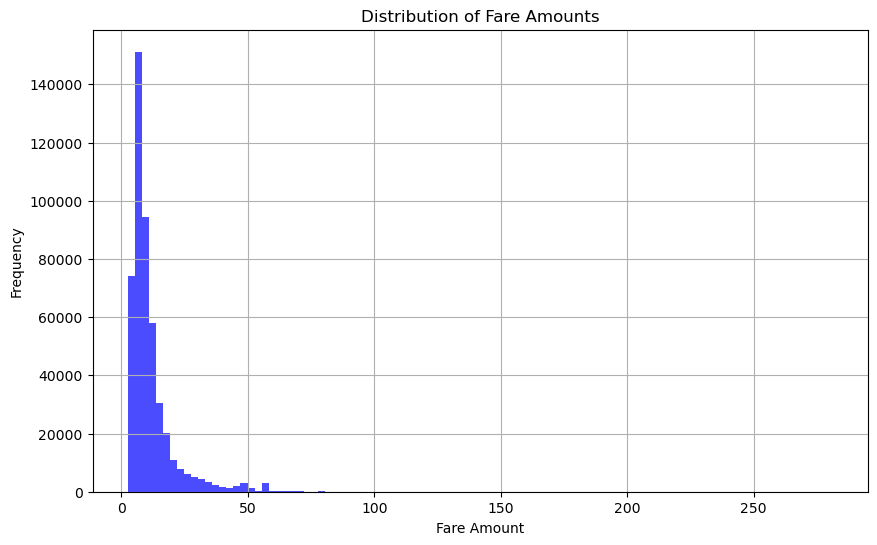

In [87]:
# Assuming df is your DataFrame containing the "fare_amount" column
fare_amounts = df['fare_amount']

# Plotting the distribution of fare amounts as a histogram
plt.figure(figsize=(10, 6))
plt.hist(fare_amounts, bins=100, color='blue', alpha=0.7)
plt.title('Distribution of Fare Amounts')
plt.xlabel('Fare Amount')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
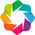

:Distribution   [fare_amount]   (Density)

In [110]:
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')
hv.Distribution(df['fare_amount']).opts(title="Fare Amount Distribution", color="red",
                                                        xlabel="Fare Amount", ylabel="Density")\
.opts(opts.Distribution(width=700, height=300,tools=['hover'],show_grid=True))

    The fare amount distribution exhibits a notable right-skewed pattern.

6- let's creating a box plot showing the distribution of fare amounts in the dataset, with any outliers clearly visible as points beyond the whiskers of the box plot.

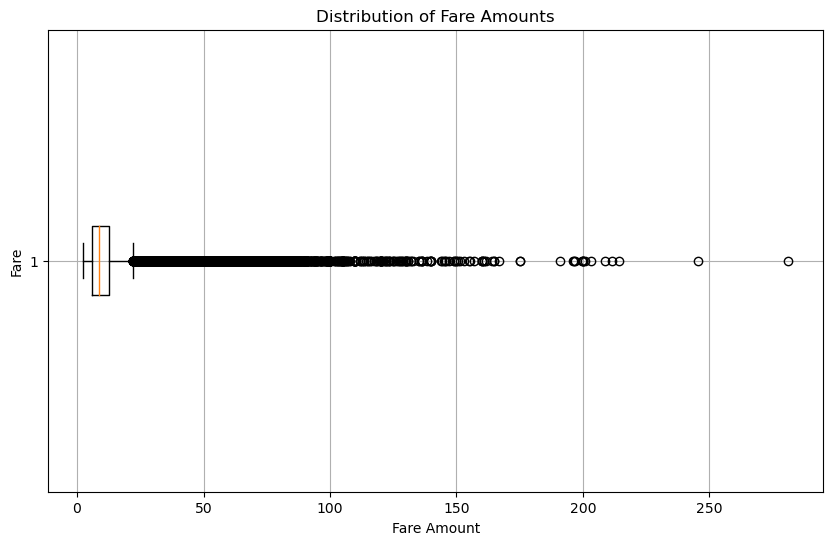

In [88]:
fare_amounts = df['fare_amount']

# Plotting a box plot to visualize outliers in fare amounts
plt.figure(figsize=(10, 6))
plt.boxplot(fare_amounts, vert=False)
plt.title('Distribution of Fare Amounts')
plt.xlabel('Fare Amount')
plt.ylabel('Fare')
plt.grid(True)
plt.show()

- too many outliers so we're gonna use robust scaler 

7- creating a box plot showing the distribution of distance in the dataset, with any outliers clearly visible as points beyond the whiskers of the box plot.

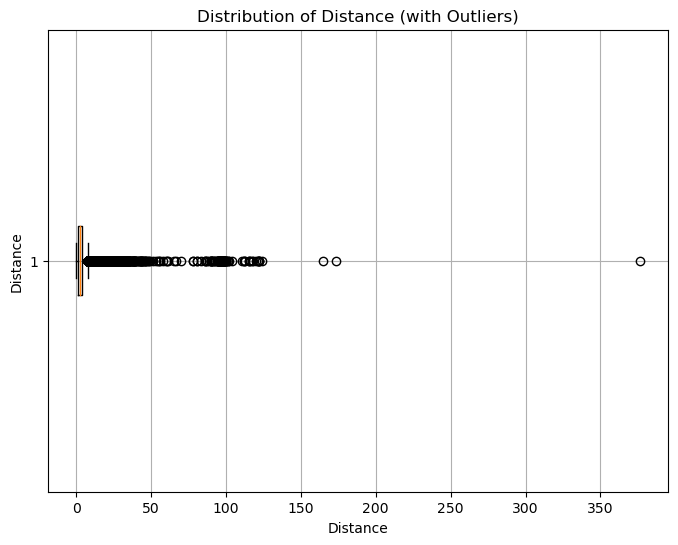

In [89]:
import matplotlib.pyplot as plt

# Assuming df is your DataFrame containing the "distance" column
distance = df['distance']

# Plotting a box plot to visualize outliers in the distance
plt.figure(figsize=(8, 6))
plt.boxplot(distance, vert=False)
plt.title('Distribution of Distance (with Outliers)')
plt.xlabel('Distance')
plt.ylabel('Distance')
plt.grid(True)
plt.show()


8- visualize the count of trips for each month

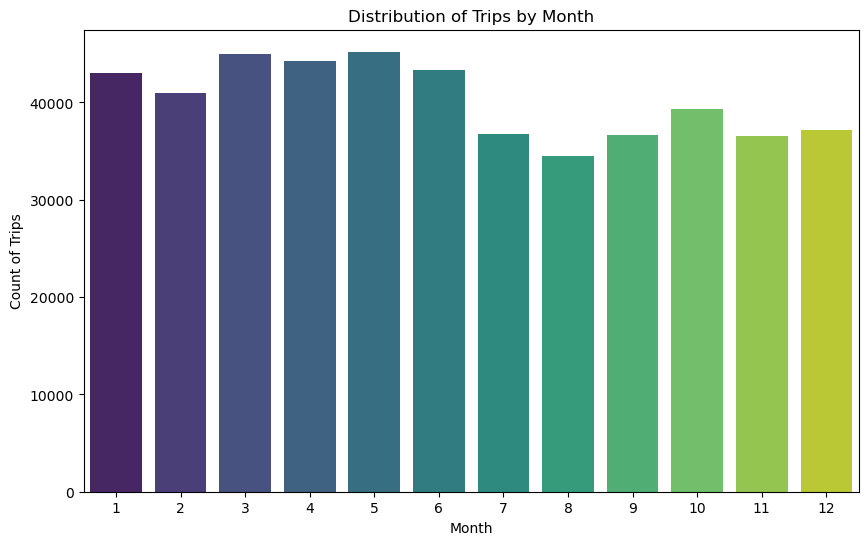

In [90]:
plt.figure(figsize=(10, 6))

# Create the bar plot
sns.countplot(data=df, x='month', palette='viridis')

# Set the title and labels
plt.title('Distribution of Trips by Month')
plt.xlabel('Month')
plt.ylabel('Count of Trips')

# Show the plot
plt.show()

9- visualize the count of trips per day.

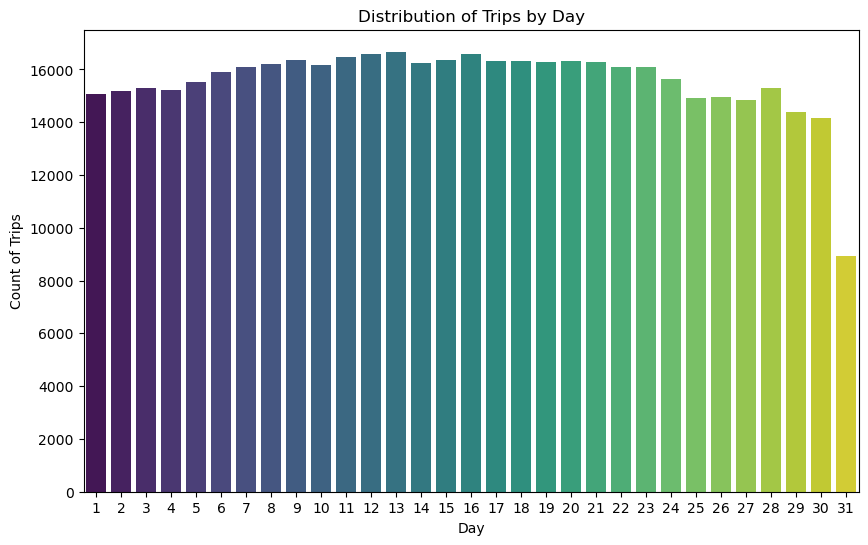

In [91]:
plt.figure(figsize=(10, 6))

# Create the count plot
sns.countplot(data=df, x='day', palette='viridis')

# Set the title and labels
plt.title('Distribution of Trips by Day')
plt.xlabel('Day')
plt.ylabel('Count of Trips')

# Show the plot
plt.show()

- As evident, the count for day 31 appears lower since not all months include this day, resulting in fewer occurrences compared to other days.






10- visualize the count of trips for each year

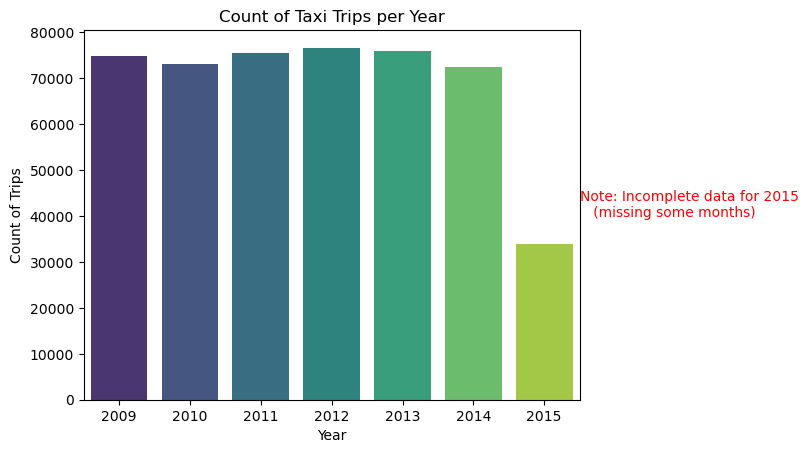

In [92]:

# Visualize the count of trips per year
sns.countplot(data=df, x='year', palette='viridis')

# Add a title and labels
plt.title('Count of Taxi Trips per Year')
plt.xlabel('Year')
plt.ylabel('Count of Trips')

# Add a note about incomplete data for 2015 with a wrapper
plt.text(0.9999, 0.5, 'Note: Incomplete data for 2015\n   (missing some months)', transform=plt.gca().transAxes, fontsize=10, color='red', wrap=True)

# Show the plot
plt.show()

In [213]:
# Create a cross-tabulation of counts of trips for each year and month
trip_counts_cross = pd.crosstab(index=df['month'], columns=df['year'])

# Display the cross-tabular format
trip_counts_cross

year,2009,2010,2011,2012,2013,2014,2015
month,,,,,,,
1,6184,6556,5857,6323,6551,6051,5527
2,6039,4952,6133,6342,6148,5844,5468
3,6277,5608,6919,6830,6802,6748,5843
4,6157,6662,6320,6516,6443,6338,5816
5,6394,6699,6579,6688,6587,6472,5799
6,6158,6465,6457,6586,6245,5945,5491
7,5944,6238,6210,6241,6283,5802,0
8,6151,5388,5624,6319,5528,5522,0
9,6209,6024,6254,6114,6204,5864,0


11- visualize the count of trips for each hour

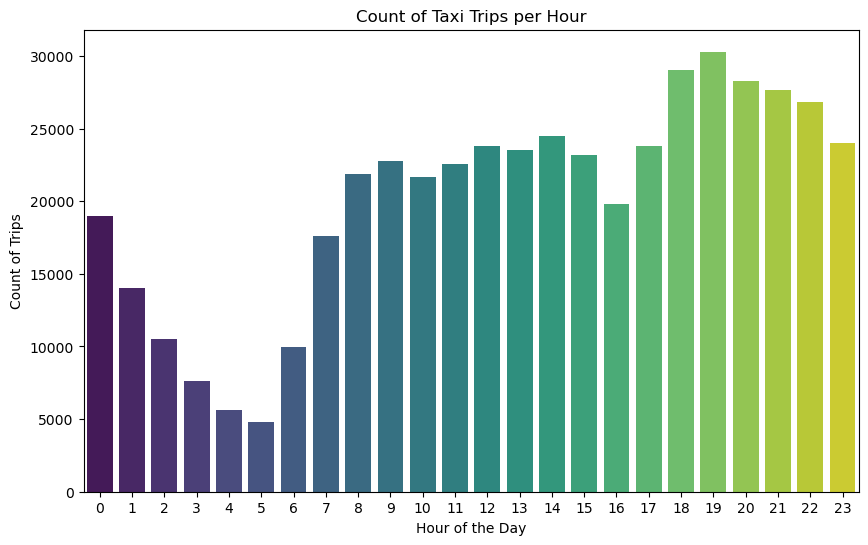

In [94]:
# Visualize the count of trips per hour
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='hour', palette='viridis')

# Add a title and labels
plt.title('Count of Taxi Trips per Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Count of Trips')

# Show the plot
plt.show()


        number of pickups is much lower during the morning peak hours, it is highest in late evenings as expected.

12- plotting pearing column

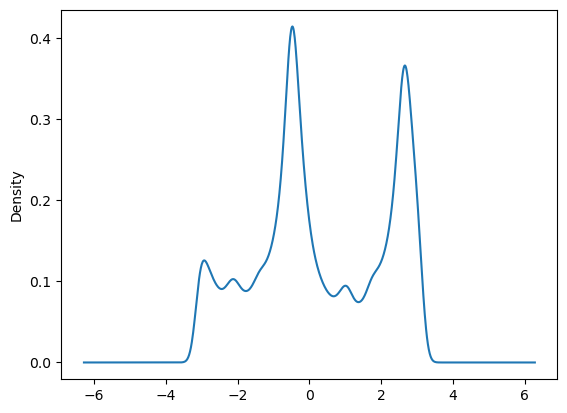

In [95]:
df['bearing'].plot(kind='kde')
plt.show()

#### it's time to bivariate analysis:

1- create a plot showing the relationship between the car condition and the fare amount

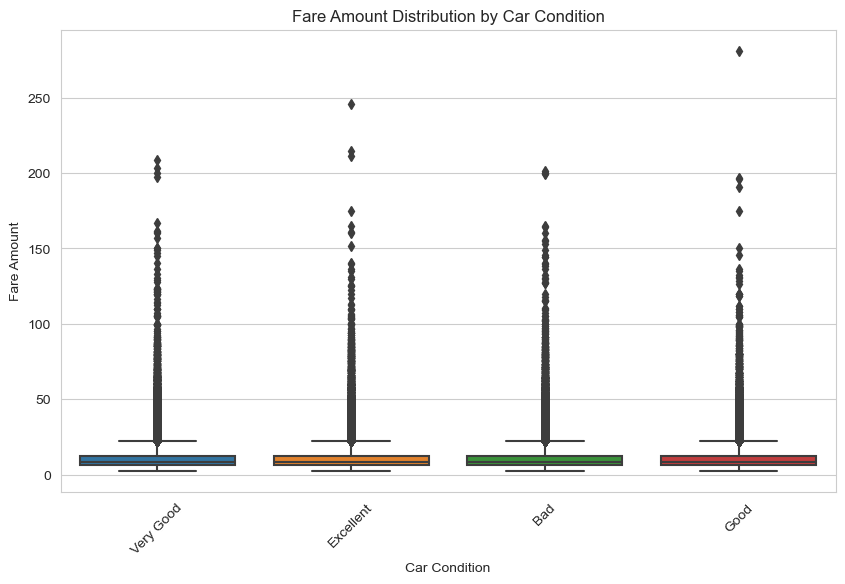

In [96]:
sns.set_style("whitegrid")

# Create the box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Car Condition', y='fare_amount', data=df)
plt.title('Fare Amount Distribution by Car Condition')
plt.xlabel('Car Condition')
plt.ylabel('Fare Amount')
plt.xticks(rotation=45)
plt.show()

This plot provided insights into how the fare amount varies across different car conditions.

2-  create a box plot to visualize the relationship between the traffic condition and the fare amount.

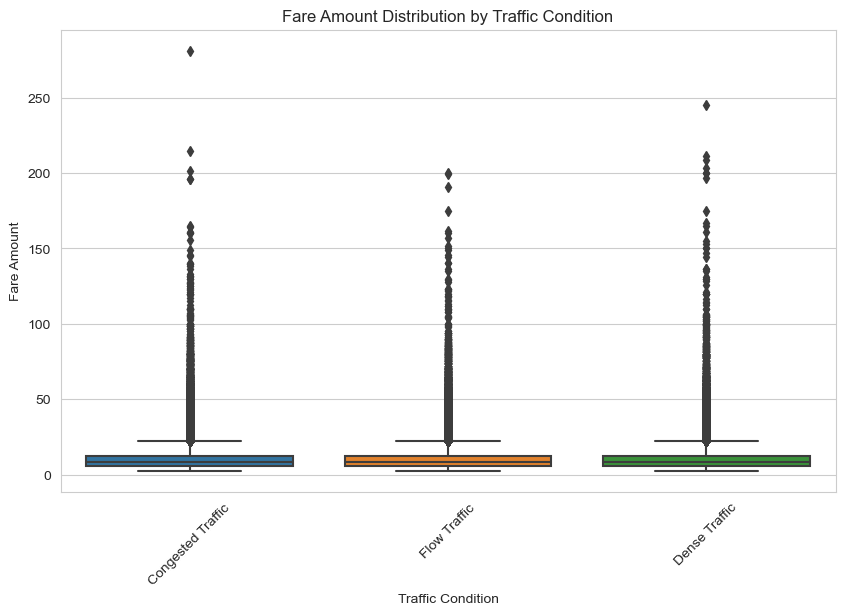

In [97]:
# Create the box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Traffic Condition', y='fare_amount', data=df)
plt.title('Fare Amount Distribution by Traffic Condition')
plt.xlabel('Traffic Condition')
plt.ylabel('Fare Amount')
plt.xticks(rotation=45)
plt.show()


3- generate a count plot showing the distribution of trips for each weather condition across different hours of the day

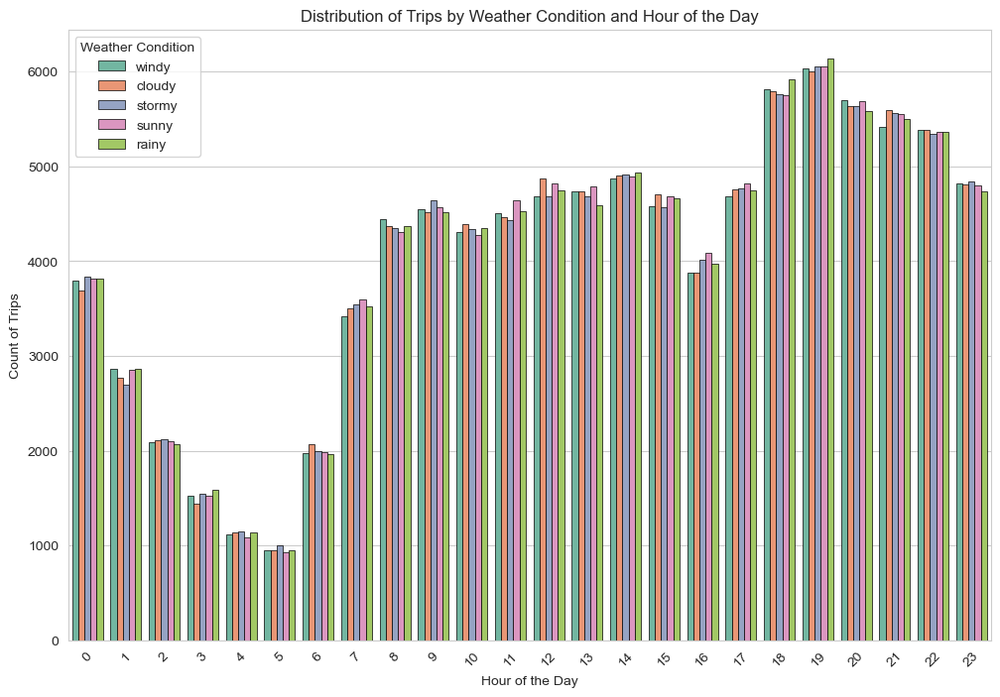

In [98]:
plt.figure(figsize=(12, 8))

# Create the stacked count plot
sns.countplot(data=df, x='hour', hue='Weather', palette='Set2', edgecolor='black', linewidth=0.5, saturation=0.75)

# Set the title and labels
plt.title('Distribution of Trips by Weather Condition and Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Count of Trips')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.legend(title='Weather Condition')
plt.show()

- The weather condition does not seem to have a significant influence on taxi trips.

4-Distribution of Trips by Month and Year

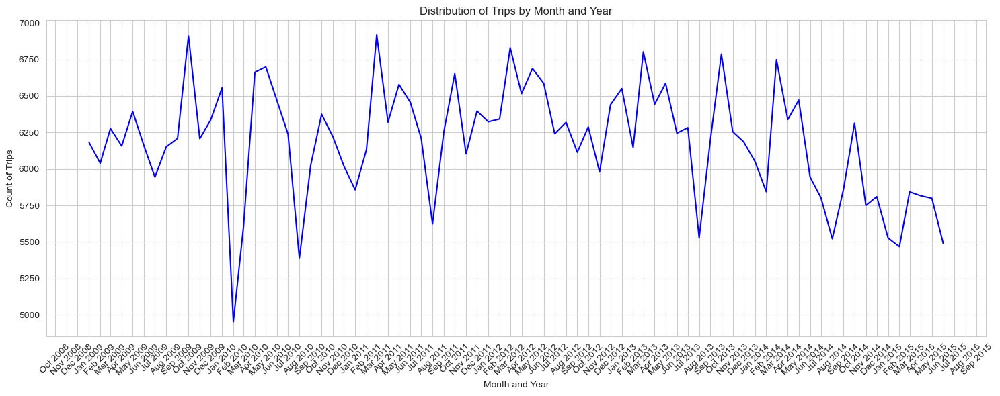

In [99]:
from matplotlib.dates import MonthLocator, DateFormatter
# Combine month and year into a new column
df['month_year'] = df['year'].astype(str) + '-' + df['month'].astype(str).str.zfill(2)

# Aggregate the data by month and year to calculate the count of trips
trip_counts = df.groupby('month_year').size().reset_index(name='trip_count')

# Convert month_year to datetime format for sorting
trip_counts['month_year'] = pd.to_datetime(trip_counts['month_year'], format='%Y-%m')

# Sort the DataFrame by month_year
trip_counts = trip_counts.sort_values(by='month_year')

# Set the size of the plot
plt.figure(figsize=(15, 6))

# Create a line plot for the count of trips by month and year
sns.lineplot(data=trip_counts, x='month_year', y='trip_count', color='blue')

# Set the title and labels
plt.title('Distribution of Trips by Month and Year')
plt.xlabel('Month and Year')
plt.ylabel('Count of Trips')

# Set x-axis tick marks to display every month
plt.gca().xaxis.set_major_locator(MonthLocator())
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


- The decline in taxi trips starting from July 2014 could be attributed to various factors. Some potential reasons could include:

1- Economic Factors: Economic conditions can have a significant impact on people's travel behaviors. A downturn in the economy or changes in employment rates could lead to reduced discretionary spending, including on transportation services like taxis.

2- Competition from Ride-Sharing Services: The rise of ride-sharing services like Uber and Lyft might have started to impact the taxi industry around that time. These services often offer lower fares and greater convenience, attracting passengers away from traditional taxis.

3- Regulatory Changes: Changes in regulations governing the taxi industry, such as fare adjustments, licensing requirements, or restrictions on operating hours, could influence the availability and affordability of taxi services.

4- Technological Advancements: Advances in technology might have made alternative transportation options more accessible and convenient for consumers. For example, the widespread adoption of smartphones and mobile apps for ride-hailing could have shifted consumer preferences away from traditional taxi services.



5- create an interactive map using Plotly Express, where each point represents a pickup location from the DataFrame

In [100]:
import plotly.express as px

# Select a subset of the data
df_subset = df.sample(frac=0.1)

# Create a scatter mapbox plot with a simpler map style and smaller zoom level
fig = px.scatter_mapbox(df_subset, 
                        lat="pickup_latitude_original", 
                        lon="pickup_longitude_original", 
                        zoom=8,
                        mapbox_style="carto-positron")

# Show the plot
fig.show()


    It appears that the longitude and latitude coordinates may be inaccurate, as the plotted locations on the map are over the water.






In [103]:
# drropping the wrong latitude and longitude
df.drop(columns =['pickup_longitude_original','pickup_latitude_original',
                  'dropoff_latitude_original','dropoff_longitude_original'],inplace =True)

6- plot the passenger count against the fare amount, and each point will be colored based on the distance quantile it belongs to.

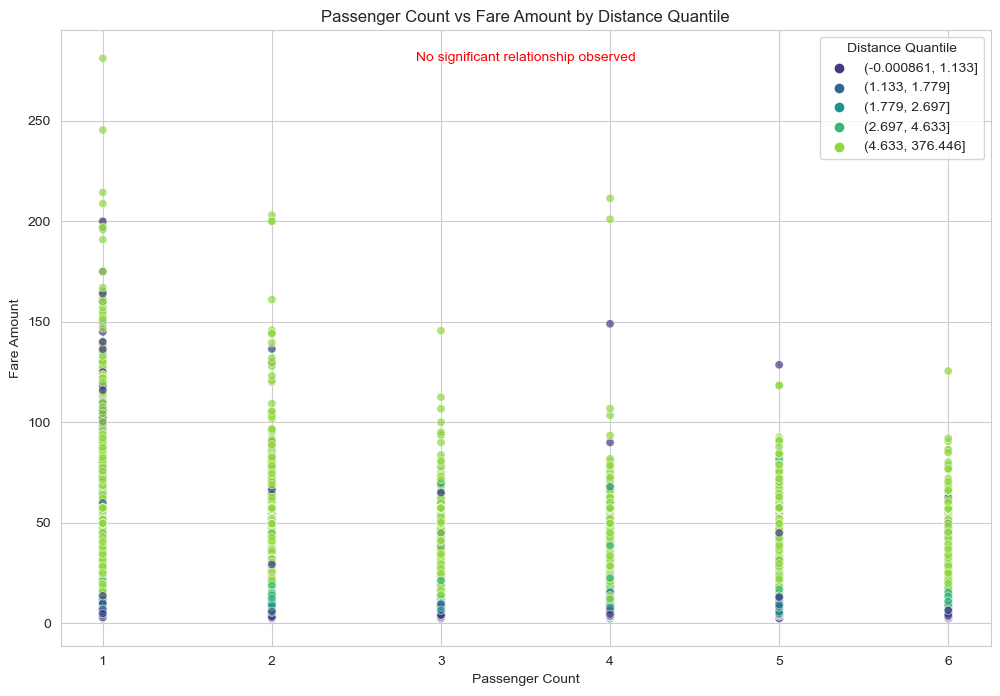

In [104]:
# Define distance quantiles
df['distance_quantile'] = pd.qcut(df['distance'], q=5)  # Split distance into 5 quantiles

# Plot passenger count against fare amount for each distance quantile
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df, x='passenger_count', y='fare_amount', hue='distance_quantile', palette='viridis', alpha=0.7)
plt.title('Passenger Count vs Fare Amount by Distance Quantile')
plt.xlabel('Passenger Count')
plt.ylabel('Fare Amount')
plt.grid(True)
plt.legend(title='Distance Quantile')

# Add a note indicating no clear relationship
plt.text(0.5, 0.95, 'No significant relationship observed', transform=plt.gca().transAxes, fontsize=10, color='red', horizontalalignment='center')

plt.show()


create a box plot to visualize the distribution of the fare amount for each day of the week

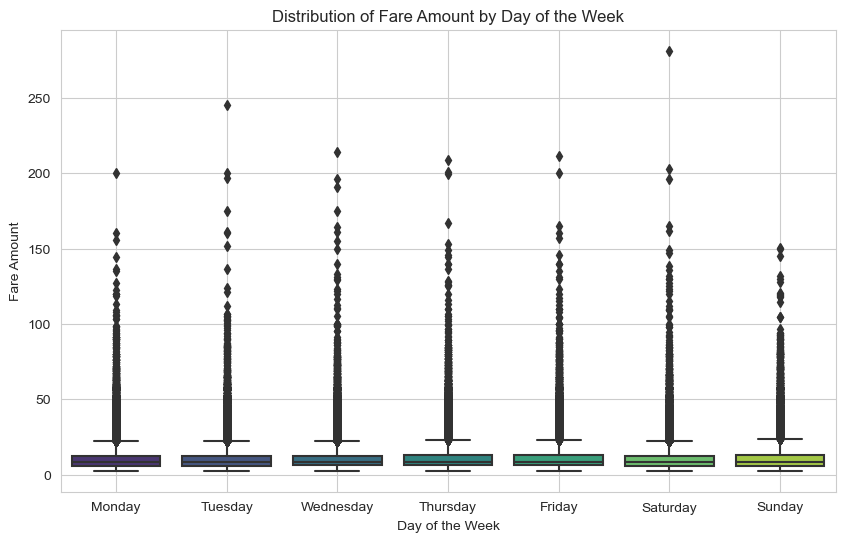

In [105]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='weekday', y='fare_amount', palette='viridis')
plt.title('Distribution of Fare Amount by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Fare Amount')
plt.xticks(ticks=range(7), labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.grid(True)
plt.show()

#### it's time to multivariate analysis:

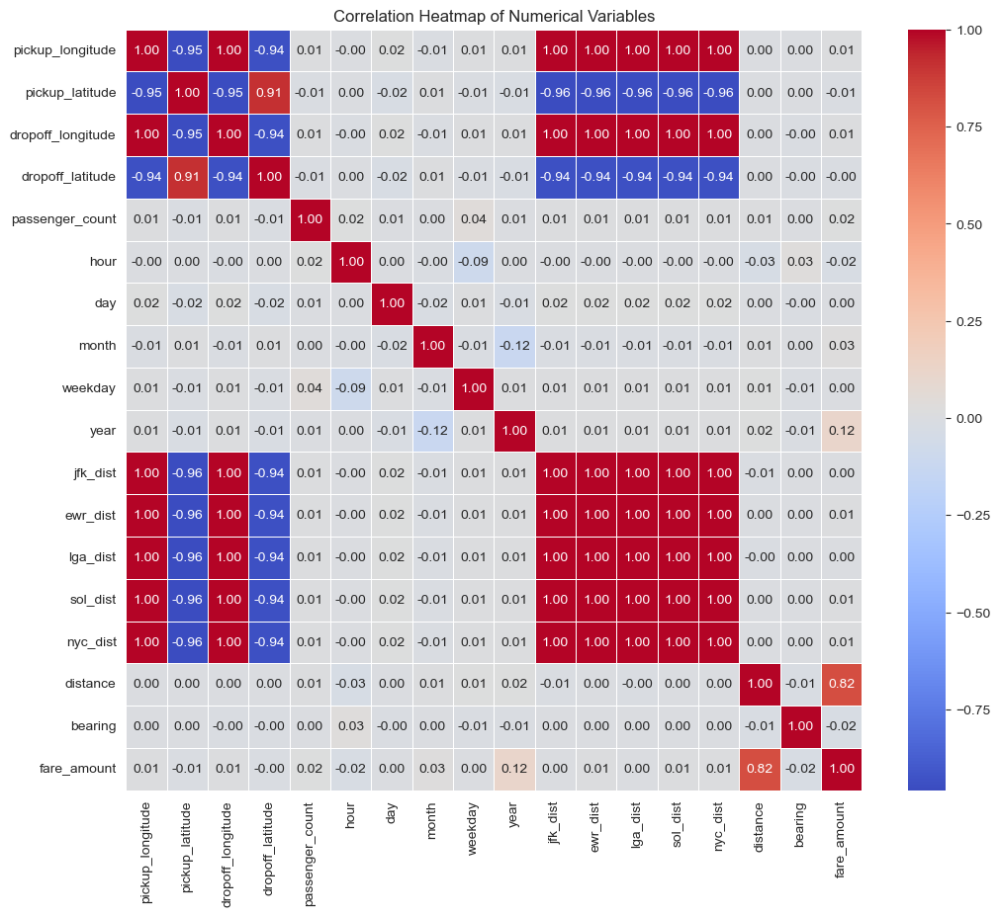

In [106]:
numerical_columns = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
                     'passenger_count', 'hour', 'day', 'month', 'weekday', 'year', 'jfk_dist', 'ewr_dist',
                     'lga_dist', 'sol_dist', 'nyc_dist', 'distance', 'bearing', 'fare_amount']

# Calculate correlation matrix
correlation_matrix = df[numerical_columns].corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Numerical Variables')
plt.show()

- There is a noticeable presence of multicollinearity among the variables, which we will address in subsequent analyses.